In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Mengecek ketersediaan GPU...
GPU Tersedia: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

--- Gambar Konten Awal ---


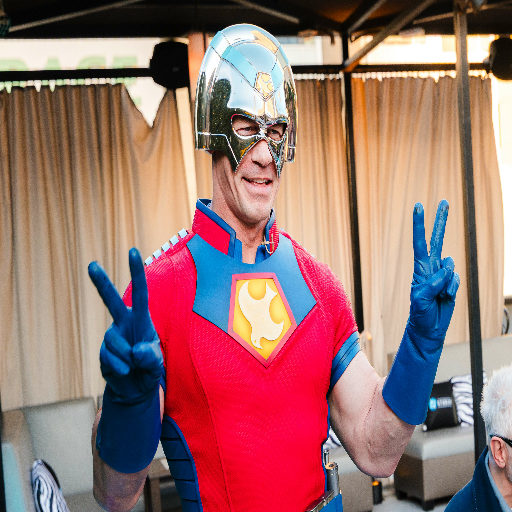


--- Gambar Style Awal ---


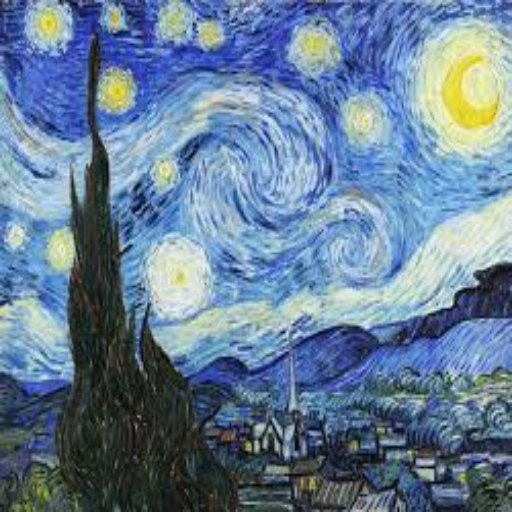

--- Memulai Style Transfer ---
Epoch 1/10, Step 50/100: Total Loss=1.5550e+03, Content Loss=4.9881e-03, Style Loss=1.5550e+03
Epoch 1/10, Step 100/100: Total Loss=8.1745e+02, Content Loss=5.2883e-03, Style Loss=8.1744e+02

--- Epoch 1 Selesai. Total Loss Akhir: 8.1745e+02 ---


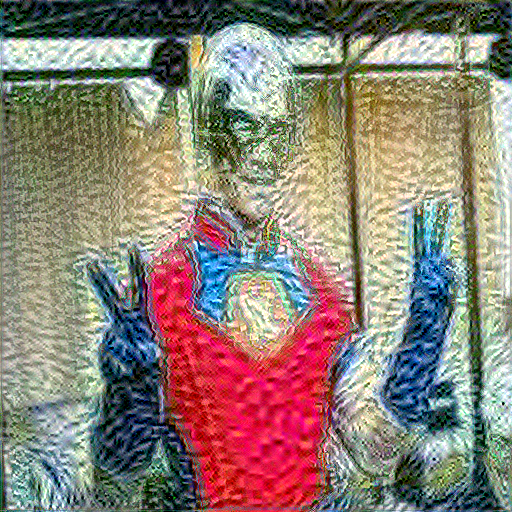

Epoch 2/10, Step 50/100: Total Loss=4.6473e+02, Content Loss=5.4018e-03, Style Loss=4.6473e+02
Epoch 2/10, Step 100/100: Total Loss=2.7846e+02, Content Loss=5.5028e-03, Style Loss=2.7846e+02

--- Epoch 2 Selesai. Total Loss Akhir: 2.7846e+02 ---


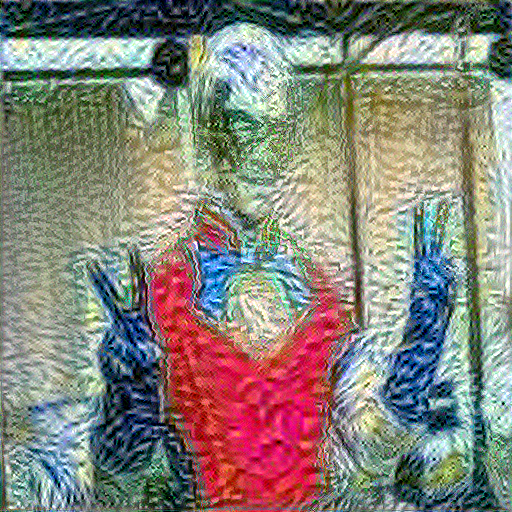

Epoch 3/10, Step 50/100: Total Loss=1.7521e+02, Content Loss=5.5924e-03, Style Loss=1.7520e+02
Epoch 3/10, Step 100/100: Total Loss=1.1612e+02, Content Loss=5.6504e-03, Style Loss=1.1611e+02

--- Epoch 3 Selesai. Total Loss Akhir: 1.1612e+02 ---


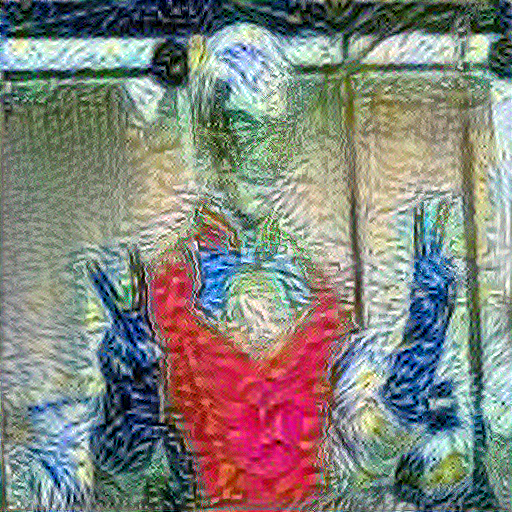

Epoch 4/10, Step 50/100: Total Loss=8.1372e+01, Content Loss=5.7132e-03, Style Loss=8.1367e+01
Epoch 4/10, Step 100/100: Total Loss=6.0080e+01, Content Loss=5.7646e-03, Style Loss=6.0074e+01

--- Epoch 4 Selesai. Total Loss Akhir: 6.0080e+01 ---


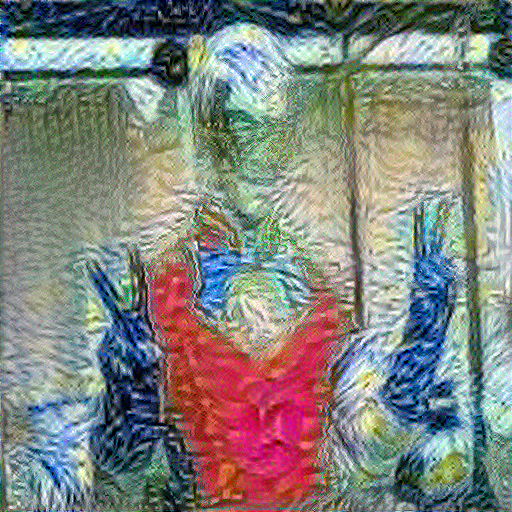

Epoch 5/10, Step 50/100: Total Loss=4.6512e+01, Content Loss=5.8015e-03, Style Loss=4.6507e+01
Epoch 5/10, Step 100/100: Total Loss=3.7511e+01, Content Loss=5.8325e-03, Style Loss=3.7505e+01

--- Epoch 5 Selesai. Total Loss Akhir: 3.7511e+01 ---


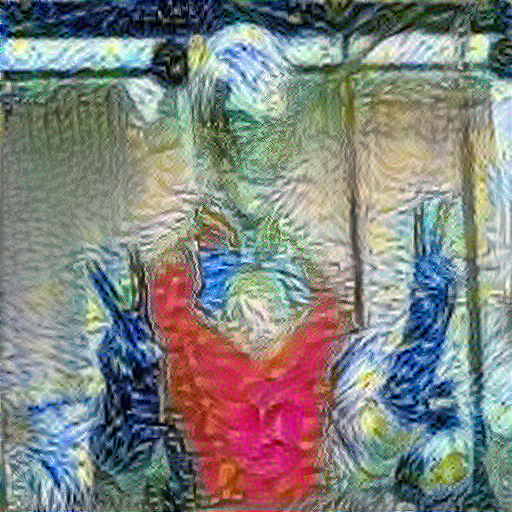

Epoch 6/10, Step 50/100: Total Loss=3.1339e+01, Content Loss=5.8567e-03, Style Loss=3.1333e+01
Epoch 6/10, Step 100/100: Total Loss=2.6960e+01, Content Loss=5.8727e-03, Style Loss=2.6954e+01

--- Epoch 6 Selesai. Total Loss Akhir: 2.6960e+01 ---


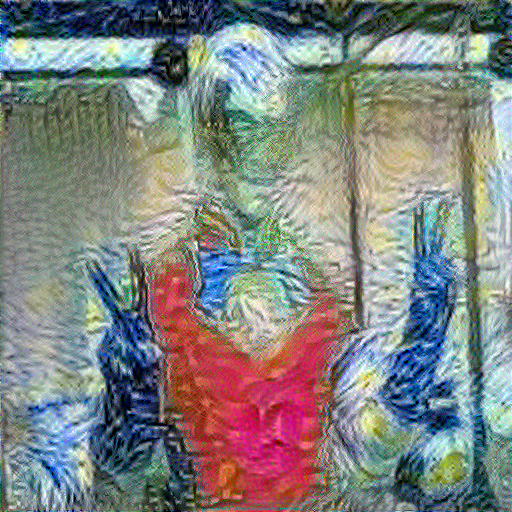

Epoch 7/10, Step 50/100: Total Loss=2.3723e+01, Content Loss=5.8838e-03, Style Loss=2.3718e+01
Epoch 7/10, Step 100/100: Total Loss=2.1264e+01, Content Loss=5.8934e-03, Style Loss=2.1258e+01

--- Epoch 7 Selesai. Total Loss Akhir: 2.1264e+01 ---


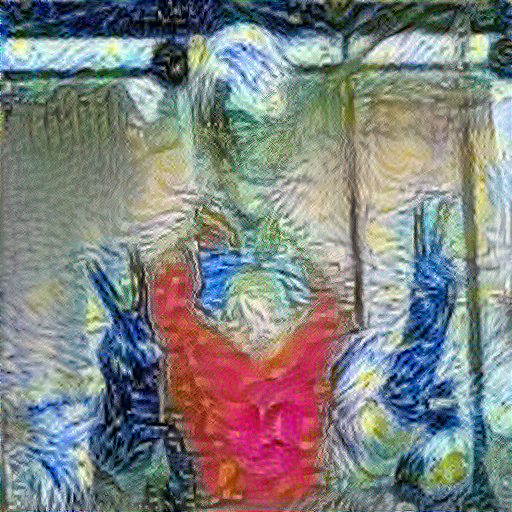

Epoch 8/10, Step 50/100: Total Loss=1.9344e+01, Content Loss=5.9000e-03, Style Loss=1.9338e+01
Epoch 8/10, Step 100/100: Total Loss=1.7802e+01, Content Loss=5.9066e-03, Style Loss=1.7796e+01

--- Epoch 8 Selesai. Total Loss Akhir: 1.7802e+01 ---


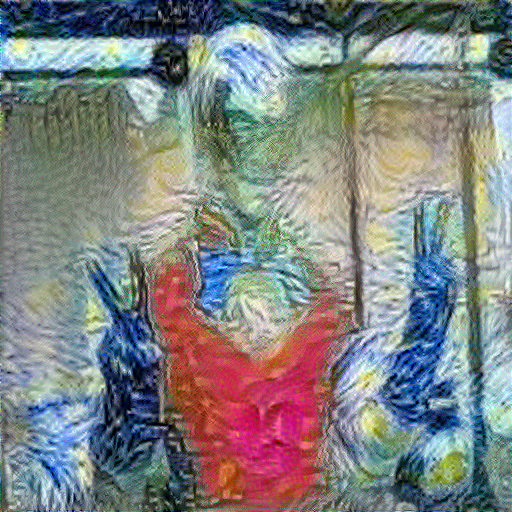

Epoch 9/10, Step 50/100: Total Loss=1.6535e+01, Content Loss=5.9129e-03, Style Loss=1.6529e+01
Epoch 9/10, Step 100/100: Total Loss=1.5473e+01, Content Loss=5.9197e-03, Style Loss=1.5467e+01

--- Epoch 9 Selesai. Total Loss Akhir: 1.5473e+01 ---


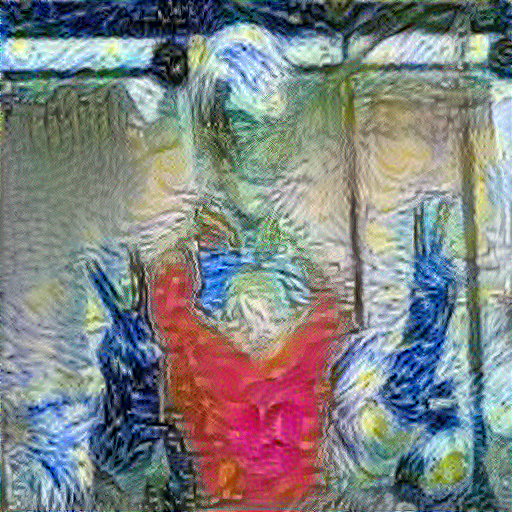

Epoch 10/10, Step 50/100: Total Loss=1.4565e+01, Content Loss=5.9254e-03, Style Loss=1.4559e+01
Epoch 10/10, Step 100/100: Total Loss=1.3775e+01, Content Loss=5.9299e-03, Style Loss=1.3769e+01

--- Epoch 10 Selesai. Total Loss Akhir: 1.3775e+01 ---


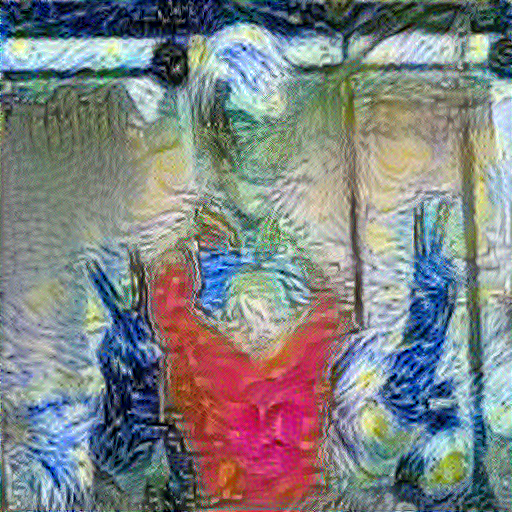


Total waktu eksekusi: 85.41 detik.

>>> Hasil akhir disimpan di: /content/drive/MyDrive/Colab Notebooks/Deep Learning/Peacemaker_Styled.png

--- Gambar Hasil Kombinasi Akhir ---


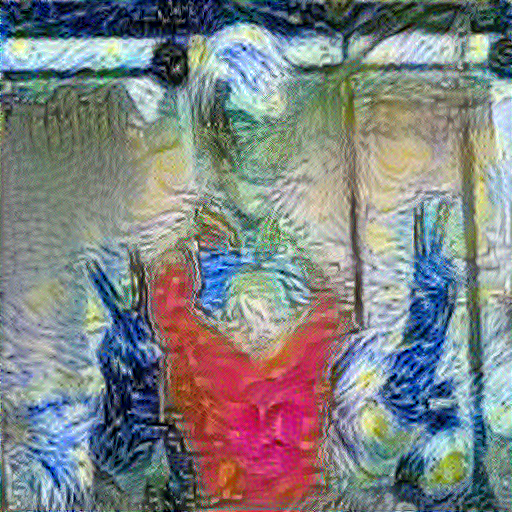

In [11]:
import tensorflow as tf
import numpy as np
# Perbaikan: Impor kelas Image dari pustaka Pillow (PIL)
from PIL import Image
from tensorflow.keras.applications import VGG19
import time
from IPython.display import display, Image as DisplayImage # Mengganti nama Image untuk display agar tidak konflik dengan PIL.Image

# --- 1. Konfigurasi dan Variabel ---

# Path gambar dari Google Drive Anda
# PASTIKAN FILE INI SUDAH ADA DI PATH YANG DITENTUKAN DI DRIVE ANDA
CONTENT_PATH = '/content/drive/MyDrive/Colab Notebooks/Deep Learning/Peacemaker.jpg'
STYLE_PATH = '/content/drive/MyDrive/Colab Notebooks/Deep Learning/neural style.jfif'

# Koefisien untuk Total Loss: Total Loss = ALPHA * Content Loss + BETA * Style Loss
# Atur BETA lebih besar dari ALPHA untuk menekankan Style (Gaya)
ALPHA = 1e-6   # Bobot Content Loss
BETA = 1e-6    # Bobot Style Loss

# Layer yang digunakan untuk menghitung Content Loss (Kedalaman Konten)
CONTENT_LAYERS = ['block5_conv2']

# Layer yang digunakan untuk menghitung Style Loss (Tekstur dan Warna)
STYLE_LAYERS = [
    'block1_conv1',
    'block2_conv1',
    'block3_conv1',
    'block4_conv1',
    'block5_conv1'
]

# Ukuran gambar yang akan diolah
IMG_HEIGHT = 512
IMG_WIDTH = 512

# Jumlah iterasi optimasi
EPOCHS = 10
STEPS_PER_EPOCH = 100

# --- 2. Fungsi Preprocessing dan Postprocessing Gambar ---

def load_img(path_to_img):
    """Memuat gambar dan mengubah ukurannya"""
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    # Ubah ukuran menjadi (IMG_HEIGHT, IMG_WIDTH)
    img = tf.image.resize(img, (IMG_HEIGHT, IMG_WIDTH))

    # Tambahkan dimensi batch (1, H, W, C)
    img = img[tf.newaxis, :]
    return img

def tensor_to_image(tensor):
    """Mengubah tensor menjadi numpy array (gambar)"""
    # Batasi nilai piksel antara 0 dan 255
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    # Menggunakan PIL.Image yang sudah diimpor
    return Image.fromarray(tensor)

# --- 3. Membuat Model VGG19 sebagai Feature Extractor ---

def vgg_layers(layer_names):
    """Membuat model Keras yang mengembalikan output dari layer yang ditentukan."""
    # Load VGG19 pre-trained di ImageNet
    vgg = VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    outputs = [vgg.get_layer(name).output for name in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

# Setup extractor fitur
style_extractor = vgg_layers(STYLE_LAYERS)
content_extractor = vgg_layers(CONTENT_LAYERS)

# Extractor gabungan untuk efisiensi
# Mengembalikan dict of features: {'style': ..., 'content': ...}
class StyleContentModel(tf.keras.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        # Preprocessing VGG: Menormalisasi input sesuai kebutuhan VGG (mean subtraction)
        self.preprocessor = tf.keras.applications.vgg19.preprocess_input

    def call(self, inputs):
        # Normalisasi input sesuai VGG
        inputs = inputs * 255.0
        preprocessed_input = self.preprocessor(inputs)
        outputs = self.vgg(preprocessed_input)

        # Pisahkan style dan content features
        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                          outputs[self.num_style_layers:])

        style_features = [self.gram_matrix(style_output)
                          for style_output in style_outputs]

        content_features = [content_output for content_output in content_outputs]

        return {'content': content_features,
                'style': style_features}

    def gram_matrix(self, input_tensor):
        """Menghitung Gram Matrix untuk Style Loss."""
        # Corrected einsum for Gram matrix: 'bhwc,bhwd->bcd' for (B, H, W, C) -> (B, C, C)
        result = tf.einsum('bhwc,bhwd->bcd', input_tensor, input_tensor)

        # Ambil dimensi tinggi * lebar (jumlah fitur spasial)
        input_shape = tf.shape(input_tensor)
        num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
        return result / num_locations

# --- 4. Fungsi Loss ---

def content_loss(content_features, target_content_features):
    """Menghitung Content Loss (MSE)"""
    return tf.reduce_mean(tf.square(content_features - target_content_features))

def style_loss(style_features, target_style_features):
    """Menghitung Style Loss (MSE pada Gram Matrix)"""
    # Style loss adalah jumlah dari loss di setiap layer style
    loss = tf.add_n([tf.reduce_mean(tf.square(style_feature - target_style_feature))
                     for style_feature, target_style_feature in zip(style_features, target_style_features)])
    # Jumlahkan dan normalisasi
    return loss / len(STYLE_LAYERS)

def total_loss(content_features, style_features, target_content_features, target_style_features):
    """Menghitung Total Loss gabungan"""
    c_loss = content_loss(content_features[0], target_content_features[0]) * ALPHA
    s_loss = style_loss(style_features, target_style_features) * BETA

    total = c_loss + s_loss
    return total, c_loss, s_loss

# --- 5. Langkah Utama (Gradient Descent) ---

@tf.function()
def train_step(image_to_optimize, target_content_features, target_style_features):
    """Melakukan satu langkah optimasi (Gradient Descent)"""
    with tf.GradientTape() as tape:
        model_outputs = extractor(image_to_optimize)
        loss, c_loss, s_loss = total_loss(
            model_outputs['content'],
            model_outputs['style'],
            target_content_features,
            target_style_features
        )

    # Hitung gradien Loss terhadap gambar yang dioptimasi
    grad = tape.gradient(loss, image_to_optimize)
    # Terapkan gradien menggunakan Adam Optimizer
    optimizer.apply_gradients([(grad, image_to_optimize)])

    # Jaga agar nilai piksel tetap berada di rentang [0, 1]
    image_to_optimize.assign(tf.clip_by_value(image_to_optimize, clip_value_min=0.0, clip_value_max=1.0))

    return loss, c_loss, s_loss

# --- 6. Fungsi Utama: Eksekusi NST ---

def run_style_transfer(content_path, style_path, num_epochs=EPOCHS, steps_per_epoch=STEPS_PER_EPOCH):

    # 1. Load Gambar
    content_image = load_img(content_path)
    style_image = load_img(style_path)

    # 2. Inisialisasi Gambar Hasil (Dimulai dari Gambar Konten)
    # Gunakan tf.Variable agar dapat dioptimasi
    image_to_optimize = tf.Variable(content_image)

    # 3. Ekstrak Target Features (Ini konstan)
    style_targets = extractor(style_image)['style']
    content_targets = extractor(content_image)['content']

    print("--- Memulai Style Transfer ---")
    start_time = time.time()

    best_loss, best_img = float('inf'), None

    # 4. Loop Optimasi
    for i in range(num_epochs):
        for j in range(steps_per_epoch):
            # Lakukan satu langkah pelatihan (train_step)
            loss, c_loss, s_loss = train_step(image_to_optimize, content_targets, style_targets)

            if (j + 1) % 50 == 0:
                print(f"Epoch {i+1}/{num_epochs}, Step {j+1}/{steps_per_epoch}: Total Loss={loss.numpy():.4e}, Content Loss={c_loss.numpy():.4e}, Style Loss={s_loss.numpy():.4e}")

        # Simpan gambar terbaik sejauh ini (berdasarkan loss terendah)
        if loss < best_loss:
            best_loss = loss.numpy()
            best_img = tensor_to_image(image_to_optimize)

        # Tampilkan hasil per Epoch
        print(f"\n--- Epoch {i+1} Selesai. Total Loss Akhir: {loss.numpy():.4e} ---")
        display(tensor_to_image(image_to_optimize))

    end_time = time.time()
    print(f"\nTotal waktu eksekusi: {(end_time - start_time):.2f} detik.")

    return best_img

# --- 7. Main Execution Block ---
if __name__ == '__main__':

    # Langkah Awal: Pastikan Google Drive terpasang (hanya di Colab)
    # Jalankan perintah ini di sel terpisah di Colab:
    # from google.colab import drive
    # drive.mount('/content/drive')

    print("Mengecek ketersediaan GPU...")
    print("GPU Tersedia:", tf.config.list_physical_devices('GPU'))

    # Inisialisasi Model dan Optimizer
    extractor = StyleContentModel(STYLE_LAYERS, CONTENT_LAYERS)
    optimizer = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

    # Tampilkan gambar Konten dan Style awal
    print("\n--- Gambar Konten Awal ---")
    display(tensor_to_image(load_img(CONTENT_PATH)))
    print("\n--- Gambar Style Awal ---")
    display(tensor_to_image(load_img(STYLE_PATH)))

    # Jalankan proses Style Transfer
    final_image = run_style_transfer(CONTENT_PATH, STYLE_PATH)

    # Simpan hasil akhir
    final_image_path = '/content/drive/MyDrive/Colab Notebooks/Deep Learning/Peacemaker_Styled.png'
    final_image.save(final_image_path)
    print(f"\n>>> Hasil akhir disimpan di: {final_image_path}")
    print("\n--- Gambar Hasil Kombinasi Akhir ---")
    display(final_image)